In [ ]:
# Importing necessary libraries
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
!pip install visualkeras
import visualkeras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Loading the Cats vs. Dogs dataset
dataset_name = "cats_vs_dogs"
(ds_train, ds_test), ds_info = tfds.load(dataset_name,
                                         split=['train[:80%]', 'train[80%:]'],
                                         as_supervised=True,
                                         with_info=True)

# Converting TensorFlow dataset to NumPy arrays
def dataset_to_numpy(dataset, size=(128, 128)):
    images, labels = [], []
    for img, label in tfds.as_numpy(dataset):
        img = tf.image.resize(img, size) / 255.0  # Normalising images to [0,1] range
        images.append(img)
        labels.append(label)
    return np.array(images), np.array(labels)

# Converting train and test datasets
x_train, y_train = dataset_to_numpy(ds_train)
x_test, y_test = dataset_to_numpy(ds_test)

# Printing dataset shapes
print("Training set size:", x_train.shape)
print("Test set size:", x_test.shape)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 997.4/997.4 kB 52.0 MB/s eta 0:00:00


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.HF818K_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.
Training set size: (18610, 128, 128, 3)
Test set size: (4652, 128, 128, 3)


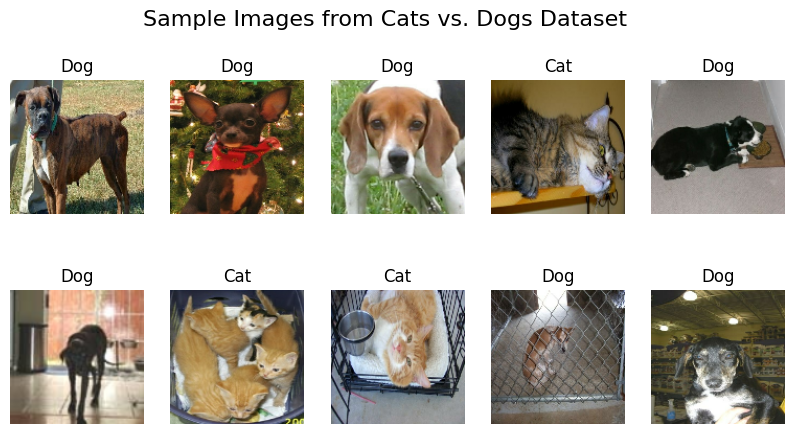

In [ ]:
# Displaying 10 sample images from the training set
plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(x_train[i])
    plt.title("Dog" if y_train[i] == 1 else "Cat")
    plt.axis("off")

plt.suptitle("Sample Images from Cats vs. Dogs Dataset", fontsize=16)
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,833 (28.20 MB)

 Trainable params: 7,392,641 (28.20 MB)

 Non-trainable params: 192 (768.00 B)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


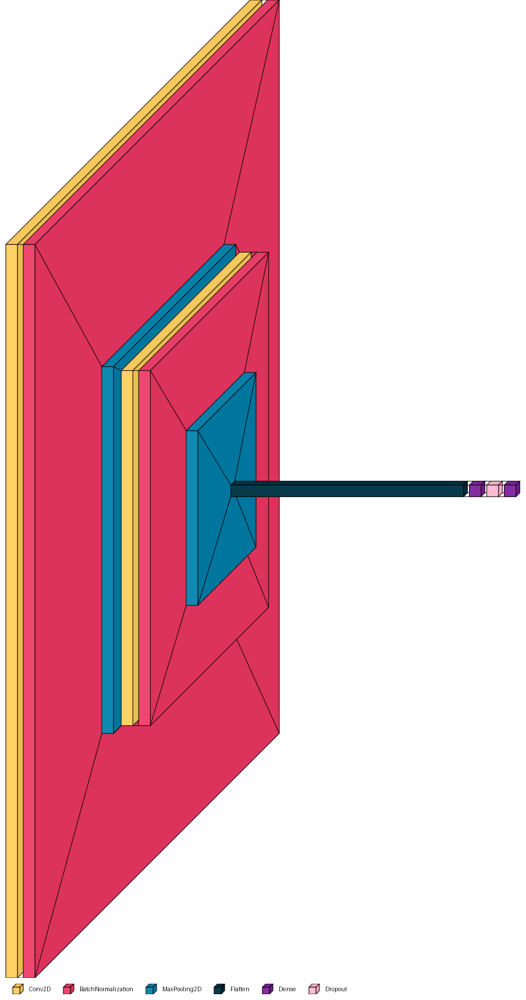

In [ ]:
# Defining a CNN model for 128x128 images
basic_model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Regularisation to prevent overfitting
    Dense(1)  # Single neuron for binary classification (Cat vs Dog)
])

# Compiling the model
basic_model.compile(optimizer='adam',
                    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                    metrics=['accuracy'])

# Displaying model summary
basic_model.summary()
visualkeras.layered_view(basic_model, scale_xy=10, legend=True)

In [ ]:
# Training the model
history_basic = basic_model.fit(x_train, y_train,
                                epochs=20,
                                batch_size=32,
                                validation_data=(x_test, y_test))

Epoch 1/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - accuracy: 0.5860 - loss: 1.5466 - val_accuracy: 0.5140 - val_loss: 0.8812
Epoch 2/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.6646 - loss: 0.5991 - val_accuracy: 0.6122 - val_loss: 0.8365
Epoch 3/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.6742 - loss: 0.5798 - val_accuracy: 0.7362 - val_loss: 0.5118
Epoch 4/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.7257 - loss: 0.4972 - val_accuracy: 0.7728 - val_loss: 0.4765
Epoch 5/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.7536 - loss: 0.4707 - val_accuracy: 0.7810 - val_loss: 0.4512
Epoch 6/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.7801 - loss: 0.4173 - val_accuracy: 0.7880 - val_loss: 0.5289
Epoch 7/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.7904 - loss: 0.3896 - val_accuracy: 0.7771 - val_loss: 0.5281
Epoch 8/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.8139 - loss: 0.3530 - 

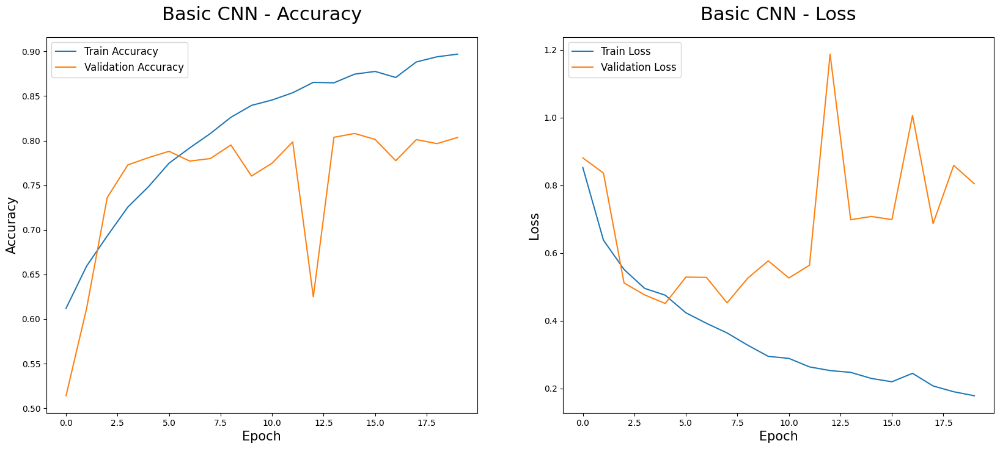

In [ ]:
def plot_training_history(history, model_name):
    """
    Plots training and validation accuracy and loss over epochs.
    """

    plt.figure(figsize=[20, 8])

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label="Train Accuracy")
    plt.plot(history.history['val_accuracy'], label="Validation Accuracy")
    plt.title(f'{model_name} - Accuracy', fontsize=22, pad=20)
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.legend(loc='upper left', fontsize=12)

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label="Train Loss")
    plt.plot(history.history['val_loss'], label="Validation Loss")
    plt.title(f'{model_name} - Loss', fontsize=22, pad=20)
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    plt.legend(loc='upper left', fontsize=12)

    plt.show()

# Calling the function to visualise training progress
plot_training_history(history_basic, "Basic CNN")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


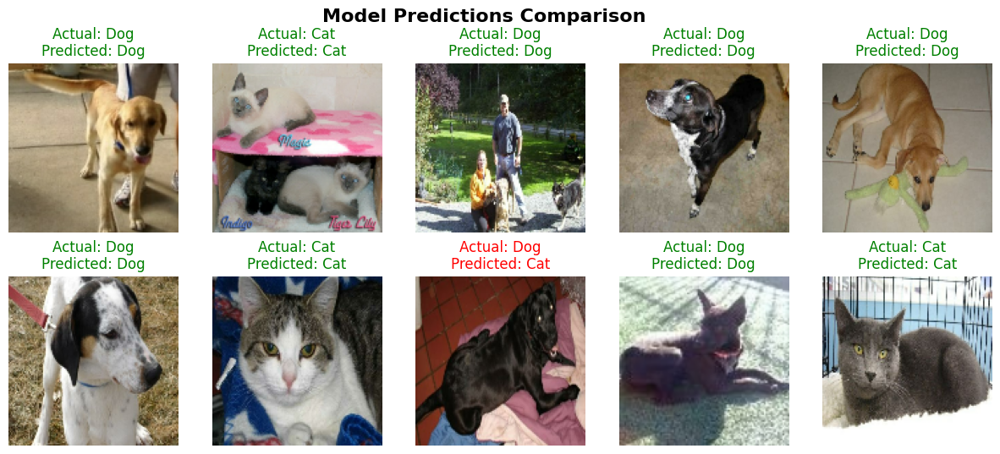

In [ ]:
def check_model_predictions(model, images, true_labels, class_names, num_samples=10):
    """
    Displayinng model predictions with color-coded labels.
    """

    predictions = model.predict(images[:num_samples])
    predicted_classes = (predictions > 0).astype(int).flatten()  # Converting probabilities to class labels

    plt.figure(figsize=(15, 6))

    for i in range(num_samples):
        plt.subplot(2, 5, i + 1)
        plt.imshow((images[i] * 255).astype(np.uint8))  # Converting back to normal color range
        plt.axis("off")

        true_class = class_names[int(true_labels[i])]
        predicted_class = class_names[int(predicted_classes[i])]
        color = "green" if true_class == predicted_class else "red"

        plt.title(f"Actual: {true_class}\nPredicted: {predicted_class}", fontsize=12, color=color)

    plt.suptitle("Model Predictions Comparison", fontsize=16, fontweight="bold")
    plt.show()

# Runing the function to visualise predictions
class_labels = ["Cat", "Dog"]
check_model_predictions(basic_model, x_test, y_test, class_labels)

146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


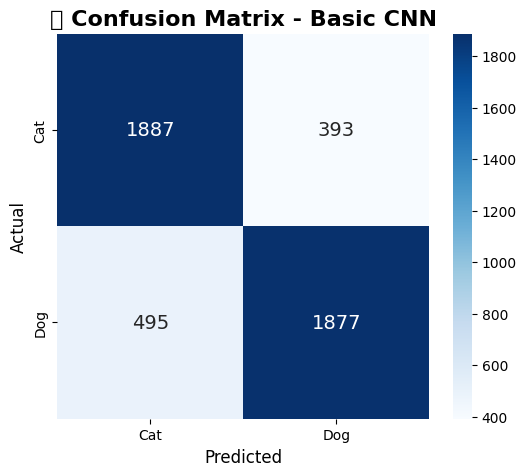

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, x_test, y_test, class_names, model_name="Model"):
    """
    Plots the confusion matrix for model predictions.
    """

    predictions = model.predict(x_test)
    predicted_classes = (predictions > 0).astype(int).flatten()  # Converting probabilities to binary labels
    true_classes = y_test.flatten()
    cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 14})
    plt.xlabel("Predicted", fontsize=12)
    plt.ylabel("Actual", fontsize=12)
    plt.title(f"📊 Confusion Matrix - {model_name}", fontsize=16, fontweight="bold")
    plt.show()

# Run the function to display the confusion matrix
class_labels = ["Cat", "Dog"]
plot_confusion_matrix(basic_model, x_test, y_test, class_labels, "Basic CNN")

In [ ]:
# Extract final accuracy and loss values
train_accuracy = history_basic.history['accuracy'][-1]
train_loss = history_basic.history['loss'][-1]
val_accuracy = history_basic.history['val_accuracy'][-1]
val_loss = history_basic.history['val_loss'][-1]

# Print results
print("\n **Final Model Evaluation:**")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Training Loss: {train_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")
print(f"Validation Loss: {val_loss:.4f}")


 **Final Model Evaluation:**
Training Accuracy: 0.8970
Training Loss: 0.1785
Validation Accuracy: 0.8035
Validation Loss: 0.8049


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129488 (\N{FACE WITH MONOCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


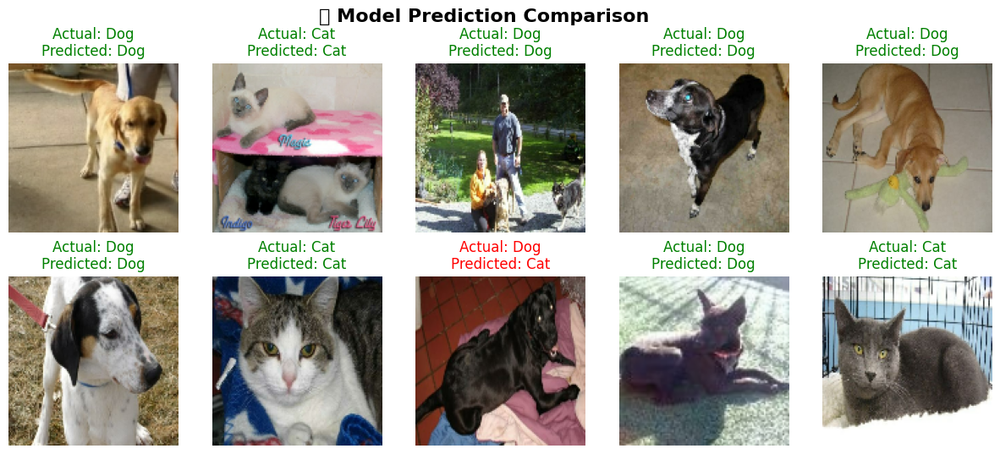

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def check_model_predictions(model, images, true_labels, class_names, num_samples=10):
    """
    Checks if the model correctly classifies images.
    """
    predictions = model.predict(images[:num_samples])
    predicted_classes = (predictions > 0).astype(int).flatten()  # Binary threshold at 0.5

    plt.figure(figsize=(15, 6))

    for i in range(num_samples):
        plt.subplot(2, 5, i + 1)
        plt.imshow((images[i] * 255).astype(np.uint8))  # Convert to normal color scale
        plt.axis("off")

        true_class = class_names[true_labels[i]]
        predicted_class = class_names[predicted_classes[i]]
        color = "green" if true_class == predicted_class else "red"

        plt.title(f"Actual: {true_class}\nPredicted: {predicted_class}", fontsize=12, color=color)

    plt.suptitle("🧐 Model Prediction Comparison", fontsize=16, fontweight="bold")
    plt.show()

# Run the function for our model
check_model_predictions(basic_model, x_test, y_test, ["Cat", "Dog"])

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(5, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


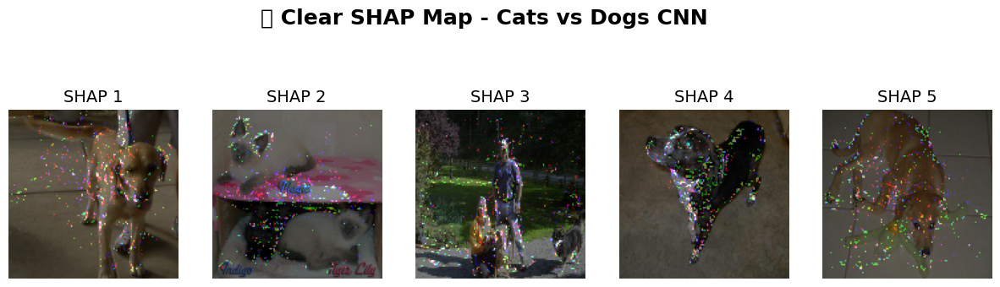

In [ ]:
import cv2
import numpy as np
import shap
import matplotlib.pyplot as plt

# Creating SHAP Explainer
background = x_train[:50]  # 50 images as background
explainer = shap.GradientExplainer(basic_model, background)

# Computing SHAP values for 5 test images
test_samples = x_test[:5]
shap_values = explainer.shap_values(test_samples)

def overlay_shap_highlight(shap_values, images, model_name, alpha=0.5, shap_scale=2000):
    """
    Creates a clear SHAP map – enhances key features and improves readability.
    """
    plt.figure(figsize=(15, 8))

    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)
        heatmap = shap_values[i].mean(axis=-1) * shap_scale

        # FILTERING: Remove low-impact areas (keep only strong features)
        threshold = np.percentile(np.abs(heatmap), 95)
        heatmap[np.abs(heatmap) < threshold] = 0

        # Normalize SHAP values to range [-1, 1]
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, -1, 1)

        # Color map "RdBu" (instead of "jet"!)
        plt.imshow(img)
        plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}", fontsize=14)

    plt.suptitle(f"📊 Clear SHAP Map - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Running SHAP
overlay_shap_highlight(shap_values, test_samples, "Cats vs Dogs CNN")

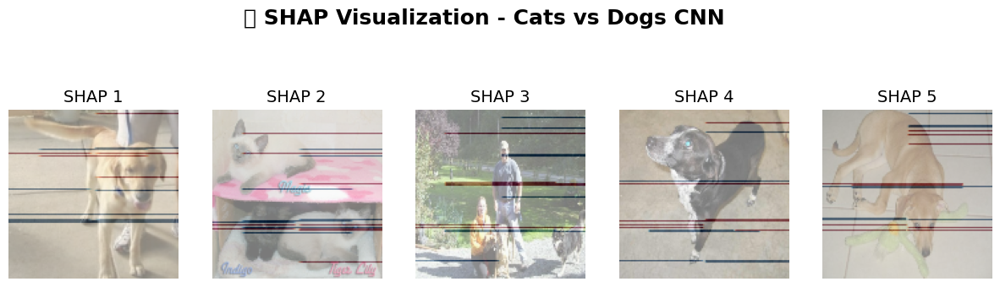

In [ ]:
import cv2
import numpy as np
import shap
import matplotlib.pyplot as plt

# Create SHAP Explainer (Gradient-based)
background = x_train[:50]  # 50 background images
explainer = shap.GradientExplainer(basic_model, background)

# Compute SHAP values for test images
test_samples = x_test[:5]
shap_values = explainer.shap_values(test_samples)

# SHAP Visualisation Function
def overlay_shap_highlight(shap_values, images, model_name, alpha=0.5, shap_scale=2000):
    plt.figure(figsize=(15, 8))

    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)

        # Fix for SHAP array indexing
        heatmap = np.mean(shap_values[0][i], axis=-1) * shap_scale

        # Thresholding weak SHAP values
        threshold = np.percentile(np.abs(heatmap), 95)
        heatmap[np.abs(heatmap) < threshold] = 0

        # Normalize SHAP
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, -1, 1)

        # Apply "RdBu" color map
        plt.imshow(img)
        plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}", fontsize=14)

    plt.suptitle(f"📊 SHAP Visualization - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Run SHAP Visualization
overlay_shap_highlight(shap_values, test_samples, "Cats vs Dogs CNN")

# Optimised CNN

In [ ]:
# Importing necessary libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Defining the Optimised CNN model
optimised_model = Sequential([
    Conv2D(32, (3,3), activation='relu', strides=(1,1), input_shape=(128, 128, 3)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu', strides=(1,1)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu', strides=(1,1)),  # Addeding a layer
    BatchNormalization(),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(256, activation='relu'),  # Increasing Dense layer size
    Dropout(0.3),  # Lowering dropout for better generalisation
    Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])

# Define an optimised Adam optimiser with a smaller learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

# Compile the model
optimised_model.compile(optimizer=optimizer,
                        loss=tf.keras.losses.BinaryCrossentropy(),
                        metrics=['accuracy'])

# Implementing Early Stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Training the model
history_optimised = optimised_model.fit(x_train, y_train,
                                        epochs=20,
                                        batch_size=32,
                                        validation_data=(x_test, y_test),
                                        callbacks=[early_stopping])

# Displaying model summary
optimised_model.summary()

Epoch 1/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - accuracy: 0.6671 - loss: 0.7102 - val_accuracy: 0.7524 - val_loss: 0.5258
Epoch 2/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.8042 - loss: 0.4272 - val_accuracy: 0.7926 - val_loss: 0.4484
Epoch 3/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.8568 - loss: 0.3255 - val_accuracy: 0.7999 - val_loss: 0.4424
Epoch 4/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9112 - loss: 0.2214 - val_accuracy: 0.8231 - val_loss: 0.4181
Epoch 5/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9545 - loss: 0.1312 - val_accuracy: 0.8304 - val_loss: 0.4119
Epoch 6/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9784 - loss: 0.0735 - val_accuracy: 0.8184 - val_loss: 0.4961
Epoch 7/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9852 - loss: 0.0528 - val_accuracy: 0.8181 - val_loss: 0.5209
Epoch 8/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9903 - loss: 0.0367 - 

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,550,661 (74.58 MB)

 Trainable params: 6,516,737 (24.86 MB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 13,033,476 (49.72 MB)

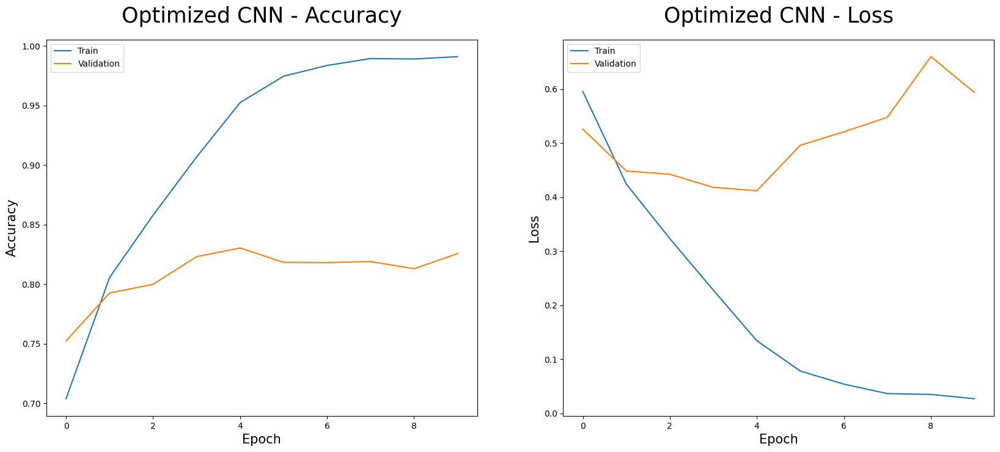

In [ ]:
import matplotlib.pyplot as plt

# Function to visualise accuracy & loss
def plot_training_history(history, model_name):
    plt.figure(figsize=[20,8])

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(f'{model_name} - Accuracy', size=25, pad=20)
    plt.ylabel('Accuracy', size=15)
    plt.xlabel('Epoch', size=15)
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Loss
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(f'{model_name} - Loss', size=25, pad=20)
    plt.ylabel('Loss', size=15)
    plt.xlabel('Epoch', size=15)
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.show()

# Plot results for Optimized Model
plot_training_history(history_optimised, "Optimized CNN")

In [ ]:
# Print final accuracy & loss
accuracy = history_optimised.history['accuracy'][-1]
val_accuracy = history_optimised.history['val_accuracy'][-1]
loss = history_optimised.history['loss'][-1]
val_loss = history_optimised.history['val_loss'][-1]

print(f"Final Training Accuracy: {accuracy:.4f}")
print(f"Final Validation Accuracy: {val_accuracy:.4f}")
print(f"Final Training Loss: {loss:.4f}")
print(f"Final Validation Loss: {val_loss:.4f}")

Final Training Accuracy: 0.9911
Final Validation Accuracy: 0.8257
Final Training Loss: 0.0271
Final Validation Loss: 0.5939


146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


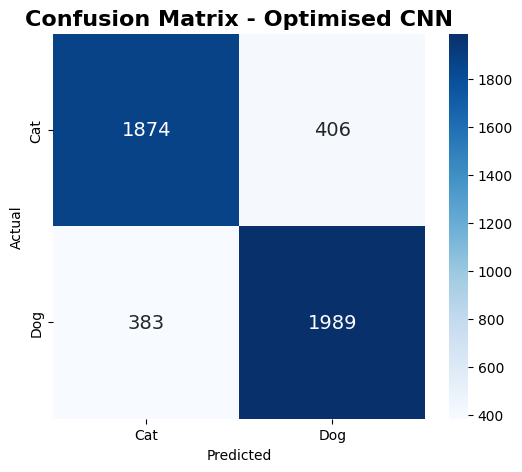

In [ ]:
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Function to generate confusion matrix
def plot_confusion_matrix(model, x_test, y_test, class_names, model_name="Model"):
    predictions = model.predict(x_test)
    predicted_classes = (predictions > 0.5).astype(int).flatten()
    true_classes = y_test.flatten()
    optimised_model_cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(6, 5))
    sns.heatmap(optimised_model_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 14})
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16, fontweight="bold")
    plt.show()

# Generate confusion matrix
class_labels = ["Cat", "Dog"]
plot_confusion_matrix(optimised_model, x_test, y_test, class_labels, "Optimised CNN")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


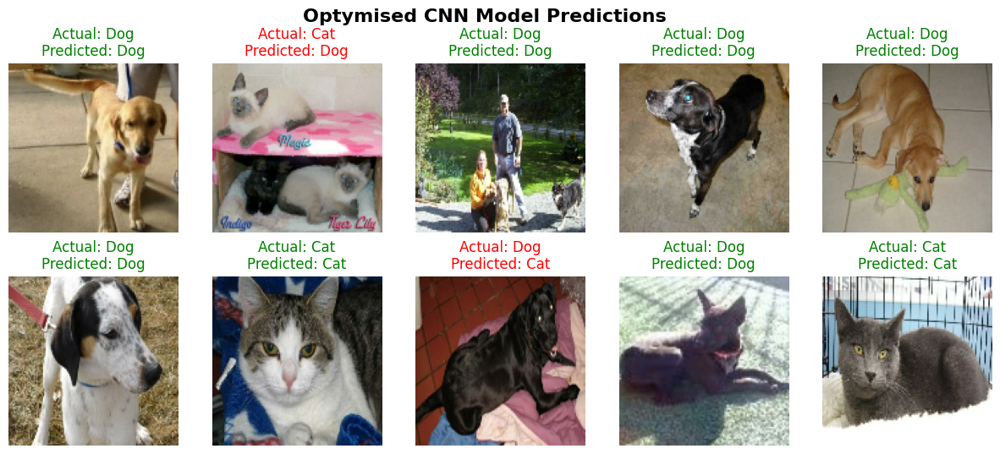

In [ ]:
def check_model_predictions(model, images, true_labels, class_names, num_samples=10):
    predictions = model.predict(images[:num_samples])
    predicted_classes = (predictions > 0.5).astype(int).flatten()

    plt.figure(figsize=(15, 6))

    for i in range(num_samples):
        plt.subplot(2, 5, i + 1)
        plt.imshow((images[i] * 255).astype(np.uint8))
        plt.axis("off")

        true_class = class_names[int(true_labels[i])]
        predicted_class = class_names[int(predicted_classes[i])]
        color = "green" if true_class == predicted_class else "red"

        plt.title(f"Actual: {true_class}\nPredicted: {predicted_class}", fontsize=12, color=color)

    plt.suptitle("Optymised CNN Model Predictions", fontsize=16, fontweight="bold")
    plt.show()

# Run prediction check
check_model_predictions(optimised_model, x_test, y_test, ["Cat", "Dog"])

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_25
Received: inputs=['Tensor(shape=(5, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_25
Received: inputs=['Tensor(shape=(50, 128, 128, 3))']
  warnings.warn(msg)


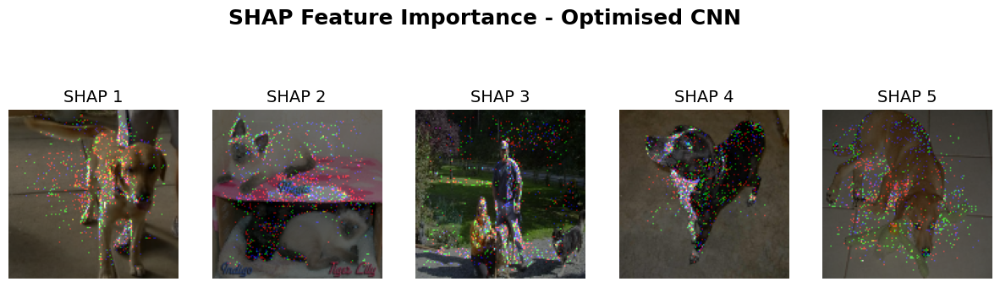

In [ ]:
import cv2
import shap
import numpy as np
import matplotlib.pyplot as plt

# Create SHAP explainer
background = x_train[:50]
explainer = shap.GradientExplainer(optimised_model, background)

# Compute SHAP values for test images
test_samples = x_test[:5]
shap_values = explainer.shap_values(test_samples)

# Function to overlay SHAP heatmap
def overlay_shap_highlight(shap_values, images, model_name, alpha=0.5, shap_scale=2000):
    plt.figure(figsize=(15, 8))

    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)
        heatmap = shap_values[i].mean(axis=-1) * shap_scale

        # Remove weak influence pixels
        threshold = np.percentile(np.abs(heatmap), 95)
        heatmap[np.abs(heatmap) < threshold] = 0

        # Normalise SHAP to [-1, 1]
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, -1, 1)

        # Show SHAP overlay
        plt.imshow(img)
        plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}", fontsize=14)

    plt.suptitle(f"SHAP Feature Importance - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Run SHAP visualisation
overlay_shap_highlight(shap_values, test_samples, "Optimised CNN")

AUGUMENTING

In [ ]:
import tensorflow as tf
import shap
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to apply image augmentations
def augment_images(images):
    augmented_images = []
    for img in images:
        img = tf.image.random_flip_left_right(img)  # Horizontal Flip
        img = tf.image.rot90(img, k=np.random.randint(1, 4))  # Random Rotation (90, 180, 270 degrees)
        img = tf.image.adjust_brightness(img, delta=0.2)  # Brightness Adjustment
        augmented_images.append(img.numpy())  # Converting Tensor to NumPy array
    return np.array(augmented_images)

# Creating an augmented test set (apply transformations to 5 test images)
x_test_augmented = augment_images(x_test[:5])

In [ ]:
# Selecting 50 training images as the SHAP background dataset
background = x_train[:50]

# Selecting 5 original test images for SHAP analysis
test_samples = x_test[:5]

# Creating a SHAP explainer based on the trained model
explainer = shap.GradientExplainer(basic_model, background)

# Computing SHAP values for the original test images
shap_values_original = explainer.shap_values(test_samples)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(5, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 128, 128, 3))']
  warnings.warn(msg)


In [ ]:
# Select 50 training images as the SHAP background dataset
background = x_train[:50]

# Select 5 original test images for SHAP analysis
test_samples = x_test[:5]

# Create a SHAP explainer based on the trained model
explainer = shap.GradientExplainer(basic_model, background)

# Compute SHAP values for the original test images
shap_values_original = explainer.shap_values(test_samples)

In [ ]:
# Compute SHAP values for the augmented test images
shap_values_augmented = explainer.shap_values(x_test_augmented)

In [ ]:
def overlay_shap_highlight(shap_values, images, title, alpha=0.5, shap_scale=2000):
    """
    Creates a clear SHAP heatmap – highlights the most important features.
    """
    plt.figure(figsize=(15, 8))

    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)  # Converting to standard image format
        heatmap = shap_values[i].mean(axis=-1) * shap_scale

        # Removing weak influence pixels – keep only the strongest SHAP features
        threshold = np.percentile(np.abs(heatmap), 95)
        heatmap[np.abs(heatmap) < threshold] = 0

        # Normalise SHAP values to the range [-1, 1]
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, -1, 1)

        # Applying "RdBu" color map (Red = Positive Influence, Blue = Negative Influence)
        plt.imshow(img)
        plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}")

    plt.suptitle(title, fontsize=18, fontweight="bold")
    plt.show()

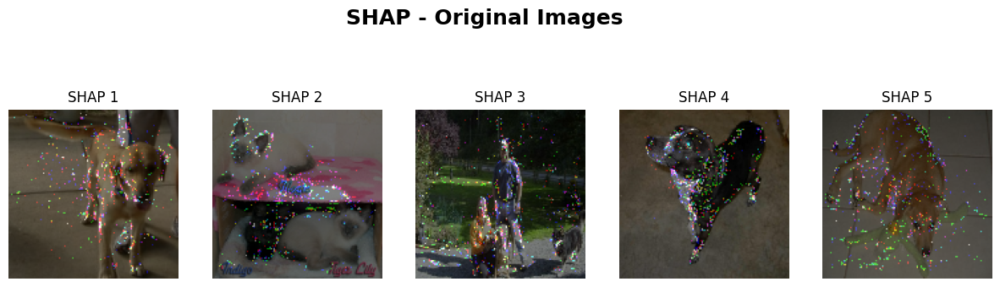

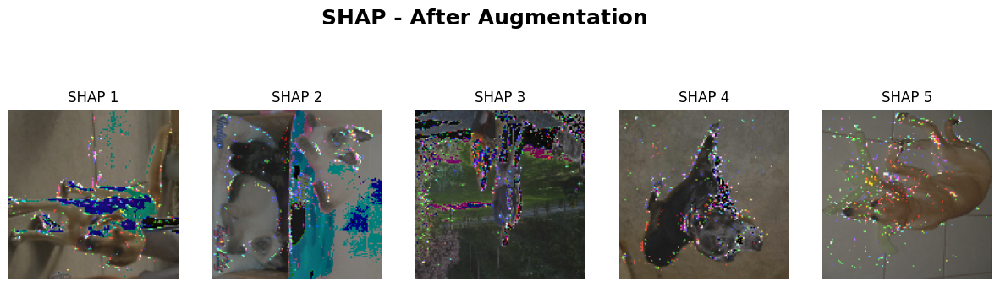

In [ ]:
# Comparing SHAP for Original vs Augmented Images
overlay_shap_highlight(shap_values_original, test_samples, "SHAP - Original Images")
overlay_shap_highlight(shap_values_augmented, x_test_augmented, "SHAP - After Augmentation")

Basic Model Augumented

In [ ]:
import tensorflow as tf
import shap
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function for Data Augmentation**
def augment_images(images):
    augmented_images = []
    for img in images:
        img = tf.image.random_flip_left_right(img)  # Horizontal Flip
        img = tf.image.rot90(img, k=np.random.randint(1, 4))  # Random Rotation (90, 180, 270)
        img = tf.image.adjust_brightness(img, delta=0.2)  # Brightness Adjustment
        augmented_images.append(img.numpy())
    return np.array(augmented_images)

# Creating Augmented Training Set**
x_train_augmented = augment_images(x_train)

# Defining Augmented CNN Model**
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

basic_model_augmented = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1)  # 1 neuron -> binary classification (Cat vs Dog)
])

# Compile and Train the Augmented Model
basic_model_augmented.compile(optimizer='adam',
                              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                              metrics=['accuracy'])

history_augmented = basic_model_augmented.fit(x_train_augmented, y_train,
                                              epochs=20,
                                              batch_size=32,
                                              validation_data=(x_test, y_test))

# Displaying Model Summary
basic_model_augmented.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - accuracy: 0.5413 - loss: 1.9344 - val_accuracy: 0.5331 - val_loss: 0.6694
Epoch 2/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.5713 - loss: 0.7001 - val_accuracy: 0.5286 - val_loss: 0.6731
Epoch 3/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.5802 - loss: 0.6480 - val_accuracy: 0.5466 - val_loss: 0.7206
Epoch 4/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6036 - loss: 0.6259 - val_accuracy: 0.5267 - val_loss: 2.1914
Epoch 5/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6239 - loss: 0.6127 - val_accuracy: 0.5163 - val_loss: 0.6771
Epoch 6/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6425 - loss: 0.5899 - val_accuracy: 0.5305 - val_loss: 0.8263
Epoch 7/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6659 - loss: 0.5795 - val_accuracy: 0.5641 - val_loss: 0.7037
Epoch 8/20
582/582 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.6875 - loss: 0.5549 - 

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,178,117 (84.60 MB)

 Trainable params: 7,392,641 (28.20 MB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 14,785,284 (56.40 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


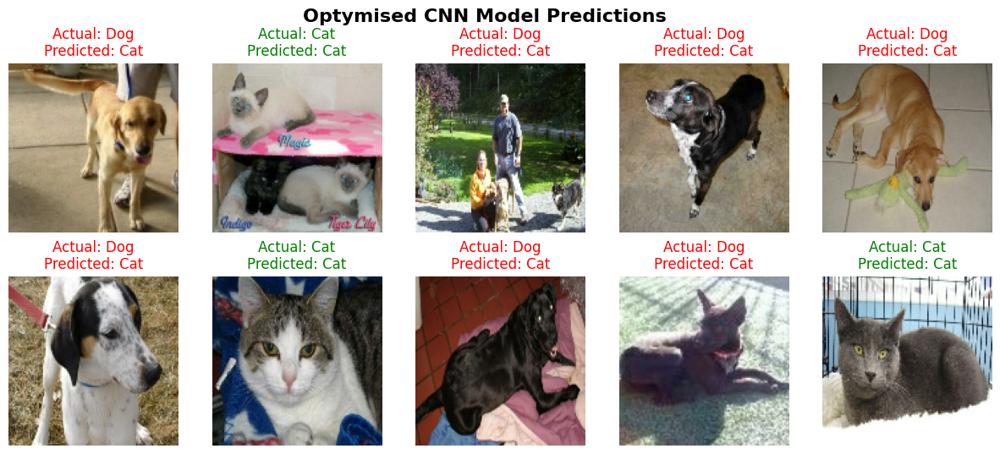

In [ ]:
# Predictions for Augmented Model
check_model_predictions(basic_model_augmented, x_test, y_test, ["Cat", "Dog"])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


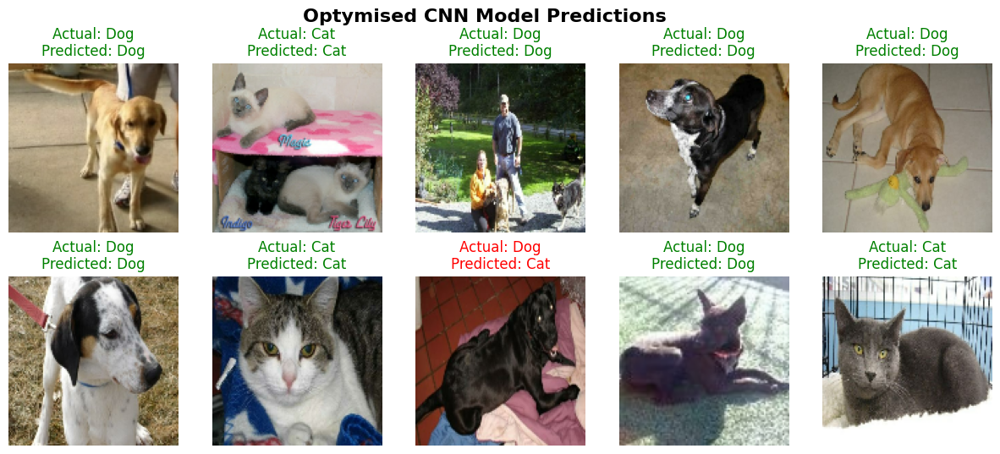

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


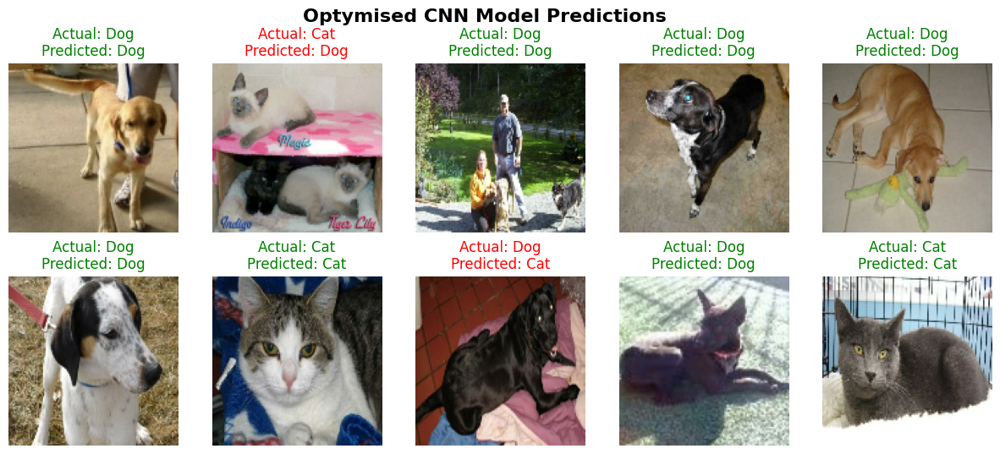

In [ ]:
check_model_predictions(basic_model, x_test, y_test, ["Cat", "Dog"])  # Basic Model
check_model_predictions(optimised_model, x_test, y_test, ["Cat", "Dog"])  # Optimised Model

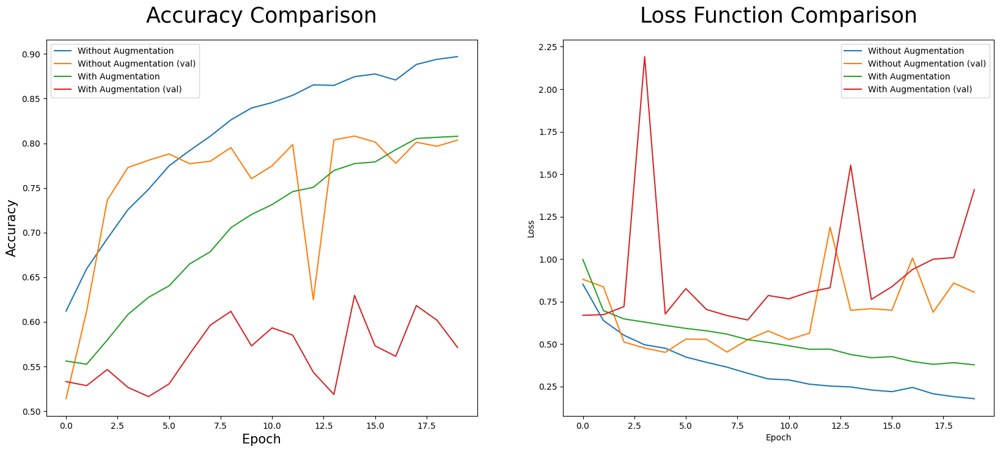

In [ ]:
# Compare Accuracy Before & After Augmentation
def compare_training(history_old, history_new, model_old, model_new):
    plt.figure(figsize=[20,8])

    # Accuracy Comparison
    plt.subplot(1,2,1)
    plt.plot(history_old.history['accuracy'], label="Without Augmentation")
    plt.plot(history_old.history['val_accuracy'], label="Without Augmentation (val)")
    plt.plot(history_new.history['accuracy'], label="With Augmentation")
    plt.plot(history_new.history['val_accuracy'], label="With Augmentation (val)")
    plt.title('Accuracy Comparison', size=25, pad=20)
    plt.ylabel('Accuracy', size=15)
    plt.xlabel('Epoch', size=15)
    plt.legend()

    # Loss Comparison
    plt.subplot(1,2,2)
    plt.plot(history_old.history['loss'], label="Without Augmentation")
    plt.plot(history_old.history['val_loss'], label="Without Augmentation (val)")
    plt.plot(history_new.history['loss'], label="With Augmentation")
    plt.plot(history_new.history['val_loss'], label="With Augmentation (val)")
    plt.title('Loss Function Comparison', size=25, pad=20)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.show()

# Comparing Model Accuracy Before & After Augmentation**
compare_training(history_basic, history_augmented, basic_model, basic_model_augmented)

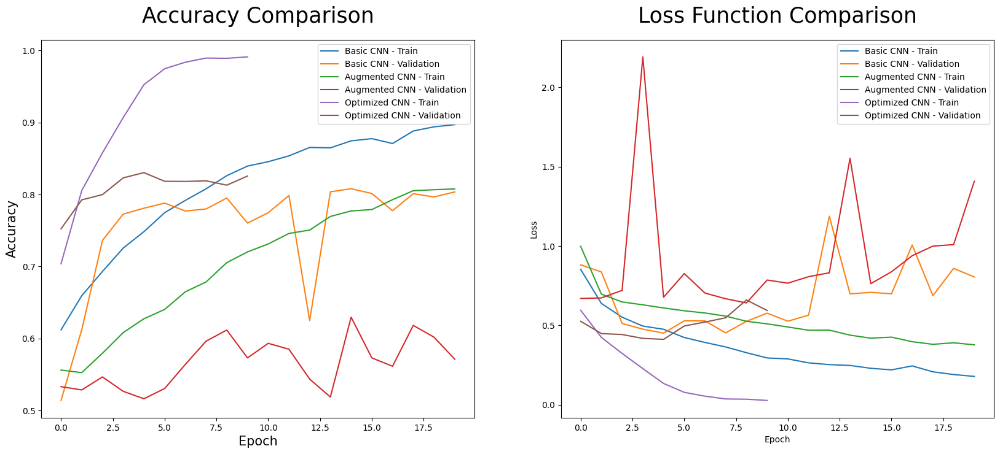

In [ ]:
# Comparing Accuracy & Loss for Basic, Augmented & Optimized Models
def compare_all_models(histories, model_names):
    plt.figure(figsize=[20,8])

    # Accuracy Comparison
    plt.subplot(1,2,1)
    for history, name in zip(histories, model_names):
        plt.plot(history.history['accuracy'], label=f"{name} - Train")
        plt.plot(history.history['val_accuracy'], label=f"{name} - Validation")
    plt.title('Accuracy Comparison', size=25, pad=20)
    plt.ylabel('Accuracy', size=15)
    plt.xlabel('Epoch', size=15)
    plt.legend()

    # Loss Comparison
    plt.subplot(1,2,2)
    for history, name in zip(histories, model_names):
        plt.plot(history.history['loss'], label=f"{name} - Train")
        plt.plot(history.history['val_loss'], label=f"{name} - Validation")
    plt.title('Loss Function Comparison', size=25, pad=20)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.show()

# Run the Comparison
histories = [history_basic, history_augmented, history_optimised]
model_names = ["Basic CNN", "Augmented CNN", "Optimized CNN"]
compare_all_models(histories, model_names)

146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


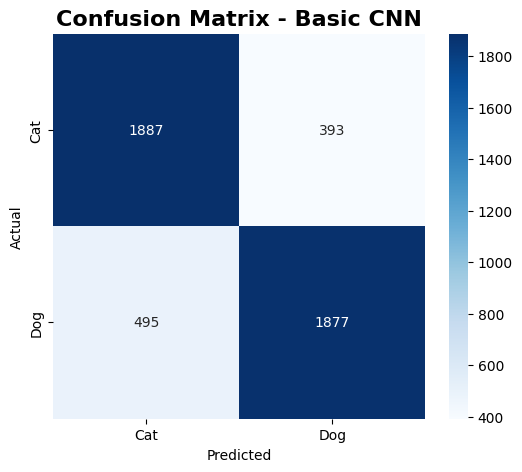

146/146 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


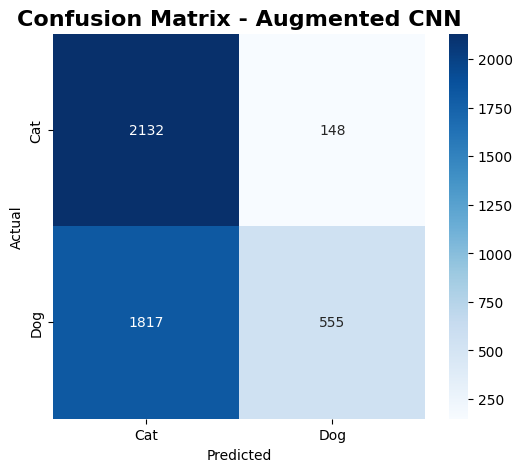

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Plot Confusion Matrix for Any Model
def plot_confusion_matrix(model, x_test, y_test, model_name):
    predictions = model.predict(x_test)
    predicted_classes = (predictions > 0).astype(int).flatten()
    true_classes = y_test.flatten()
    cm = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Cat", "Dog"], yticklabels=["Cat", "Dog"])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16, fontweight="bold")
    plt.show()

# Run Confusion Matrix for All Models
plot_confusion_matrix(basic_model, x_test, y_test, "Basic CNN")
plot_confusion_matrix(basic_model_augmented, x_test, y_test, "Augmented CNN")

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(5, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_39
Received: inputs=['Tensor(shape=(5, 128, 128, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_39
Received: inputs=['Tensor(shape=(50, 128, 128, 3))']
  warnings.warn(m

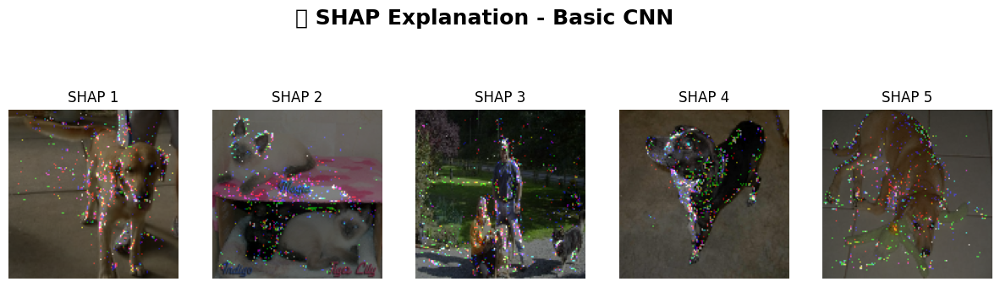

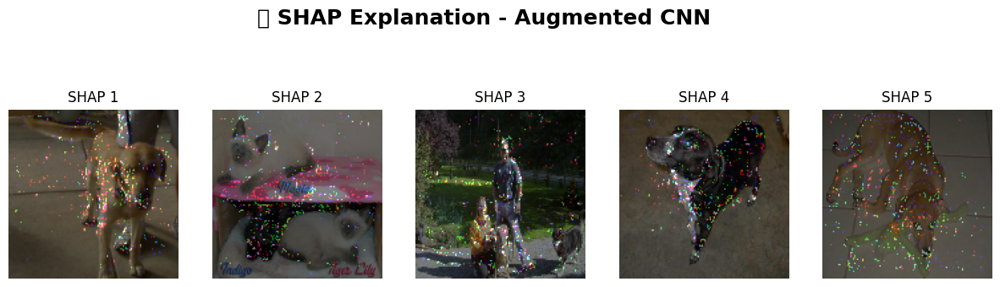

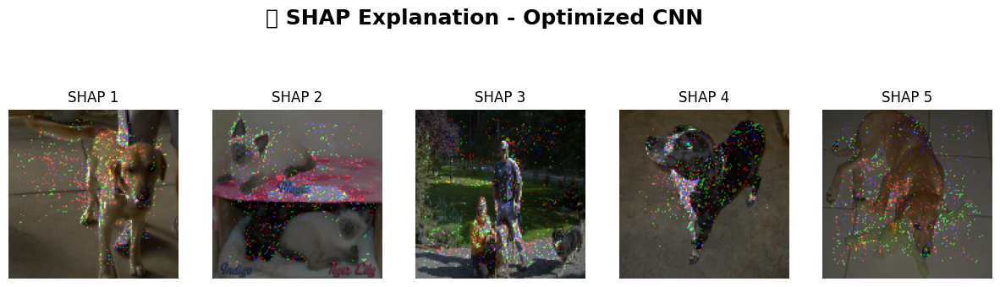

In [ ]:
import shap
import cv2

# Function to Visualise SHAP Values
def overlay_shap_highlight(shap_values, images, model_name, alpha=0.5, shap_scale=2000):
    plt.figure(figsize=(15, 8))
    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)
        heatmap = shap_values[i].mean(axis=-1) * shap_scale

        threshold = np.percentile(np.abs(heatmap), 95)
        heatmap[np.abs(heatmap) < threshold] = 0

        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, -1, 1)

        plt.imshow(img)
        plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}")

    plt.suptitle(f"📊 SHAP Explanation - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Computing SHAP Explanations for Each Model
background = x_train[:50]
test_samples = x_test[:5]

explainer_basic = shap.GradientExplainer(basic_model, background)
shap_values_basic = explainer_basic.shap_values(test_samples)

explainer_augmented = shap.GradientExplainer(basic_model_augmented, background)
shap_values_augmented = explainer_augmented.shap_values(test_samples)

explainer_optimized = shap.GradientExplainer(optimised_model, background)
shap_values_optimized = explainer_optimized.shap_values(test_samples)

# Comparing SHAP for All Models
overlay_shap_highlight(shap_values_basic, test_samples, "Basic CNN")
overlay_shap_highlight(shap_values_augmented, test_samples, "Augmented CNN")
overlay_shap_highlight(shap_values_optimized, test_samples, "Optimized CNN")

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def compare_shap_heatmaps(shap_values_list, images, model_names, alpha=0.5, shap_scale=2000):
    """
    Displays SHAP heatmaps for multiple models side by side.
    """
    num_models = len(shap_values_list)
    num_images = len(images)

    plt.figure(figsize=(15, 5 * num_images))

    for img_idx in range(num_images):  # Loop through images
        for model_idx in range(num_models):  # Loop through models
            shap_values = shap_values_list[model_idx]
            model_name = model_names[model_idx]

            # Geting SHAP values for the specific image
            img = (images[img_idx] * 255).astype(np.uint8)
            heatmap = shap_values[img_idx].mean(axis=-1) * shap_scale

            # Removing low SHAP values to highlight key areas
            threshold = np.percentile(np.abs(heatmap), 95)
            heatmap[np.abs(heatmap) < threshold] = 0

            # Resising the SHAP heatmap
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
            heatmap = np.clip(heatmap, -1, 1)

            plt.subplot(num_images, num_models, img_idx * num_models + model_idx + 1)
            plt.imshow(img)
            plt.imshow(heatmap, cmap="RdBu", alpha=alpha)
            plt.axis("off")
            plt.title(f"{model_name} - Image {img_idx + 1}", fontsize=12)

    plt.suptitle("SHAP Heatmap Comparison - Different Models", fontsize=18, fontweight="bold")
    plt.show()

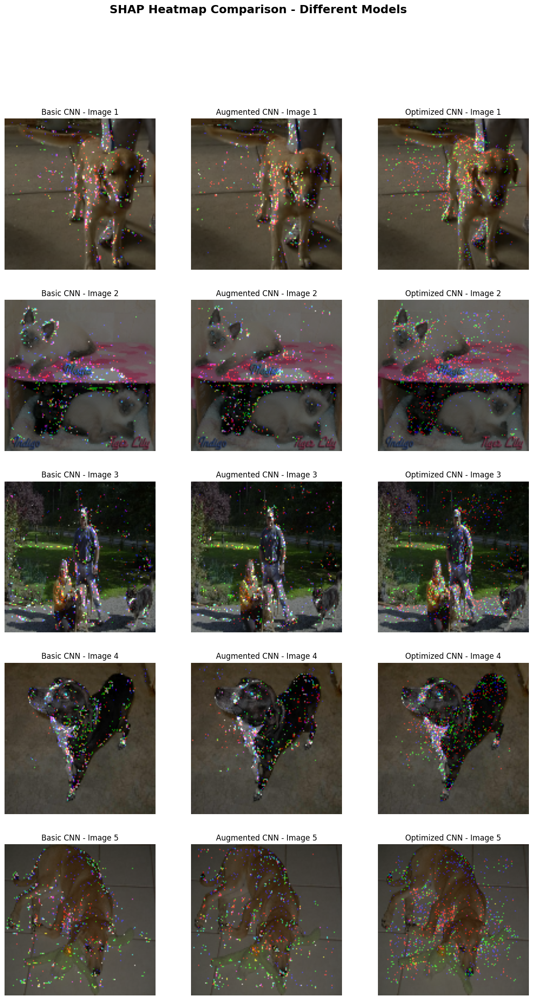

In [ ]:
compare_shap_heatmaps(
    [shap_values_basic, shap_values_augmented, shap_values_optimized],
    x_test[:5],
    ["Basic CNN", "Augmented CNN", "Optimized CNN"]
)

SHAP Summary Plot

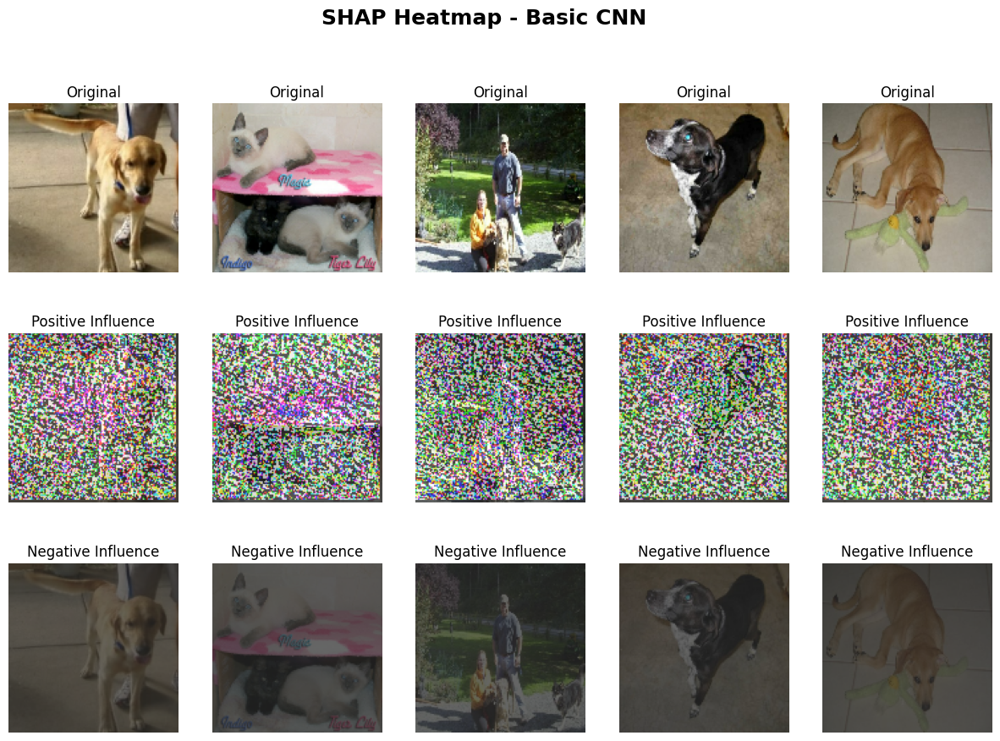

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import cv2

def overlay_shap_split(shap_values, images, model_name, alpha=0.6, shap_scale=2000):
    """
    Displays SHAP heatmaps separately for positive and negative contributions.
    """
    plt.figure(figsize=(15, 10))

    for i in range(len(images)):
        img = (images[i] * 255).astype(np.uint8)
        heatmap = shap_values[i].mean(axis=-1) * shap_scale  # Aggregating channels

        # Spliting SHAP into positive and negative attributions
        positive = np.clip(heatmap, 0, None)  # Only positive contributions
        negative = np.clip(heatmap, None, 0)  # Only negative contributions

        # Resising and normalize
        positive = cv2.resize(positive, (img.shape[1], img.shape[0]))
        negative = cv2.resize(negative, (img.shape[1], img.shape[0]))

        # Ploting original, positive and negative SHAP
        plt.subplot(3, len(images), i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title("Original")

        plt.subplot(3, len(images), i + 1 + len(images))
        plt.imshow(img, alpha=0.7)
        plt.imshow(positive, cmap="Reds", alpha=alpha)
        plt.axis("off")
        plt.title("Positive Influence")

        plt.subplot(3, len(images), i + 1 + 2 * len(images))
        plt.imshow(img, alpha=0.7)
        plt.imshow(negative, cmap="Blues", alpha=alpha)
        plt.axis("off")
        plt.title("Negative Influence")

    plt.suptitle(f"SHAP Heatmap - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Computing SHAP for test samples
background = x_train[:50]
explainer = shap.GradientExplainer(basic_model, background)
test_samples = x_test[:5]
shap_values_basic = explainer.shap_values(test_samples)

# Displaying SHAP with split influence
overlay_shap_split(shap_values_basic, test_samples, "Basic CNN")

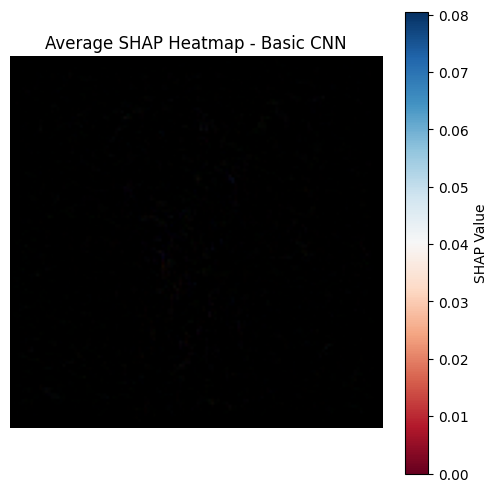

In [ ]:
def average_shap_heatmap(shap_values, model_name):
    """
    Displays the average SHAP heatmap across multiple images.
    """
    mean_shap = np.mean([shap_val.mean(axis=-1) for shap_val in shap_values], axis=0)
    plt.figure(figsize=(6, 6))
    plt.imshow(mean_shap, cmap="RdBu")
    plt.colorbar(label="SHAP Value")
    plt.title(f"Average SHAP Heatmap - {model_name}")
    plt.axis("off")
    plt.show()

# Displaying average SHAP heatmap
average_shap_heatmap(shap_values_basic, "Basic CNN")

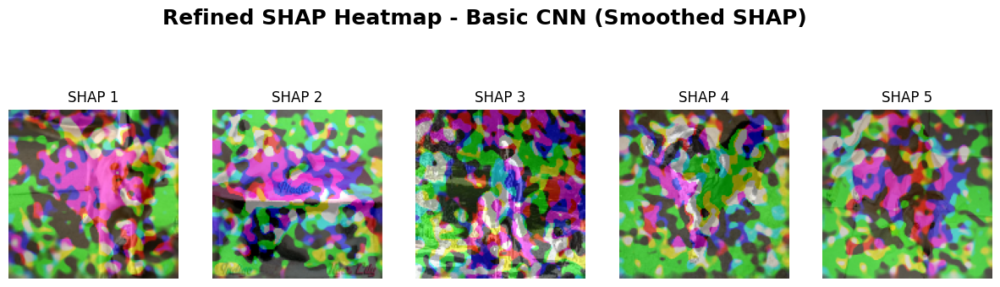

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import shap

def overlay_shap_smooth(shap_values, images, model_name, alpha=0.5, shap_scale=2000, blur_ksize=(15, 15)):
    """
    Creates a refined SHAP heatmap by smoothing noise and highlighting key features.
    """
    plt.figure(figsize=(15, 8))

    for i in range(len(images)):
        plt.subplot(2, len(images), i + 1)
        img = (images[i] * 255).astype(np.uint8)
        heatmap = shap_values[i].mean(axis=-1) * shap_scale

        # Applying Gaussian Blurring to remove scattered noise
        heatmap = cv2.GaussianBlur(heatmap, blur_ksize, 0)

        # Normalising SHAP values to range [0, 1]
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.clip(heatmap, 0, 1)

        # Displaying SHAP heatmap overlaid on the original image
        plt.imshow(img)
        plt.imshow(heatmap, cmap="coolwarm", alpha=alpha)
        plt.axis("off")
        plt.title(f"SHAP {i+1}")

    plt.suptitle(f"Refined SHAP Heatmap - {model_name}", fontsize=18, fontweight="bold")
    plt.show()

# Run SHAP with smoothing
overlay_shap_smooth(shap_values_basic, x_test[:5], "Basic CNN (Smoothed SHAP)")